In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import os
import h5py
import datetime
import henon_map_cpp as hm
from tqdm.notebook import tqdm
from numba import njit, prange

In [9]:
OMEGA_X = 0.168 # 0.168
OMEGA_Y = 0.201 # 0.201
EPSILON = 16.0
MU = 0.00

ANGULAR_SAMPLES = 100
LINEAR_SAMPLES = 100

R_MAX = 0.75

MAX_TURNS = int(1e5)


In [10]:
angles = np.linspace(0, np.pi / 2, ANGULAR_SAMPLES)
radiuses = np.linspace(0, R_MAX, LINEAR_SAMPLES + 1)[1:]

rr, aa = np.meshgrid(radiuses, angles)

xx = rr * np.cos(aa)
x = xx.flatten()
px = np.zeros_like(x)
yy = rr * np.sin(aa)
y = yy.flatten()
py = np.zeros_like(y)

In [4]:
particles = hm.particles(x, px, y, py, force_CPU=True)

# start chronometer
start = datetime.datetime.now()

tracker = hm.henon_tracker(MAX_TURNS, OMEGA_X, OMEGA_Y, "sps", epsilon=EPSILON, force_CPU=True)
tracker.track(particles, MAX_TURNS, mu=MU, barrier=10.0)
steps = particles.get_steps()

# end chronometer
end = datetime.datetime.now()

# print elapsed time
print("Elapsed time: {}".format(end - start))

Elapsed time: 0:00:03.234872


In [5]:
steps = particles.get_steps()
s = steps.flatten()

/tmp/ipykernel_39255/3036093264.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('viridis')


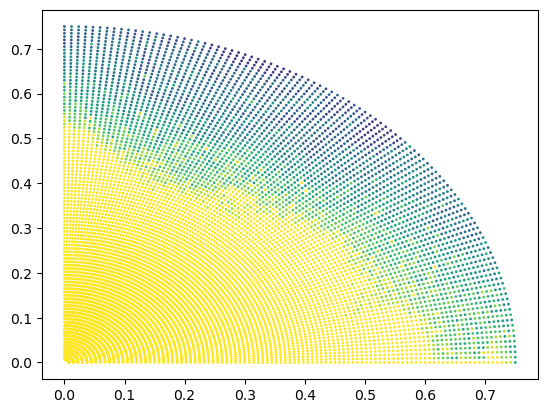

In [6]:
cmap = matplotlib.cm.get_cmap('viridis')
s_c = cmap(np.log10(s) / np.log10(MAX_TURNS))

plt.scatter(x, y, c=s_c, s=1)

In [7]:
ANGULAR_SAMPLES = 50
EXTRA_ANGULAR_SAMPLES = 50
LINEAR_SAMPLES = 10

R_MIN = 0.4
R_MAX = 0.55

PRE_TURNS = 0
TURNS = 500

In [112]:
angles = np.linspace(0, np.pi / 2, ANGULAR_SAMPLES)
radiuses = np.linspace(R_MIN, R_MAX, LINEAR_SAMPLES)

x_angles_samples = np.linspace(0, 2*np.pi, EXTRA_ANGULAR_SAMPLES)
y_angles_samples = np.linspace(0, 2*np.pi, EXTRA_ANGULAR_SAMPLES)

rr, aa, xa, ya = np.meshgrid(radiuses, angles, x_angles_samples, y_angles_samples, indexing='ij')

xx = rr * np.cos(aa) * np.cos(xa)
x = xx.flatten()
px = rr * np.cos(aa) * np.sin(xa)
px = px.flatten()
yy = rr * np.sin(aa) * np.cos(ya)
y = yy.flatten()
py = rr * np.sin(aa) * np.sin(ya)
py = py.flatten()

In [113]:
np.sqrt(x**2 + px**2 + y**2 + py**2)

array([0.4 , 0.4 , 0.4 , ..., 0.55, 0.55, 0.55])

In [114]:
particles = hm.particles(x, px, y, py, force_CPU=True)

# start chronometer
start = datetime.datetime.now()

tracker = hm.henon_tracker(MAX_TURNS, OMEGA_X, OMEGA_Y, "sps", epsilon=EPSILON, force_CPU=True)

if PRE_TURNS > 0:
    tracker.track(particles, PRE_TURNS, mu=MU, barrier=10.0)

x_list = []
px_list = []
y_list = []
py_list = []

amplitude_std_x = []
amplitude_std_y = []
amplitude_std_all = []
alive = []

t_x = particles.get_x()
t_px = particles.get_px()
t_y = particles.get_y()
t_py = particles.get_py()
t_steps = particles.get_steps()

t_x = t_x.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
t_px = t_px.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
t_y = t_y.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
t_py = t_py.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
t_steps = t_steps.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))

x_list.append(t_x)
px_list.append(t_px)
y_list.append(t_y)
py_list.append(t_py)

amplitude_std_x.append(np.nanstd(np.sqrt(t_x**2 + t_px**2), axis=(-1, -2)))
amplitude_std_y.append(np.nanstd(np.sqrt(t_y**2 + t_py**2), axis=(-1, -2)))
amplitude_std_all.append(np.nanstd(np.sqrt(t_x**2 + t_px**2 + t_y**2 + t_py**2), axis=(-1, -2)))
alive.append(np.count_nonzero(t_steps, axis=(-1, -2)))

for i in tqdm(range(PRE_TURNS, TURNS)):
    tracker.track(particles, 1, mu=MU, barrier=10.0)
    t_x = particles.get_x()
    t_px = particles.get_px()
    t_y = particles.get_y()
    t_py = particles.get_py()
    t_steps = particles.get_steps()

    t_x = t_x.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
    t_px = t_px.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
    t_y = t_y.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
    t_py = t_py.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
    t_steps = t_steps.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))

    x_list.append(t_x)
    px_list.append(t_px)
    y_list.append(t_y)
    py_list.append(t_py)

    amplitude_std_x.append(np.nanstd(np.sqrt(t_x**2 + t_px**2), axis=(-1, -2)))
    amplitude_std_y.append(np.nanstd(np.sqrt(t_y**2 + t_py**2), axis=(-1, -2)))
    amplitude_std_all.append(np.nanstd(np.sqrt(t_x**2 + t_px**2 + t_y**2 + t_py**2), axis=(-1, -2)))
    alive.append(np.count_nonzero(t_steps < i+1, axis=(-1, -2)))

x_list = np.array(x_list)
px_list = np.array(px_list)
y_list = np.array(y_list)
py_list = np.array(py_list)

amplitude_std_x = np.array(amplitude_std_x)
amplitude_std_y = np.array(amplitude_std_y)
amplitude_std_all = np.array(amplitude_std_all)
alive = np.array(alive)
alive = 2500 - alive


  0%|          | 0/500 [00:00<?, ?it/s]

In [158]:
alive.shape

(501, 10, 50)

In [159]:
alive[-1]

array([[2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500],
       [2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500],
       [2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 25

In [145]:
tmp = (
    np.nanstd(
        (x_list ** 2 + y_list ** 2 + px_list ** 2 + py_list ** 2) 
    , axis=(-1, -2, -3))
)**2

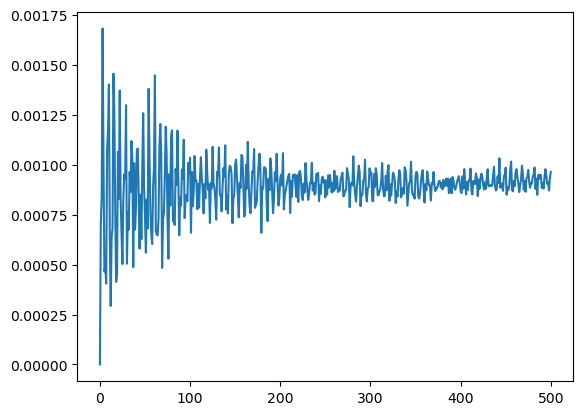

In [152]:
plt.plot(tmp[:, 0])

In [117]:
a,b = np.where(np.logical_and(alive[-1] != 2500, alive[-380] == 2500))

mask = a==7
a = a[mask]
b = b[mask]

print([(aa,bb) for aa, bb in zip(a,b)])

[(7, 2), (7, 3), (7, 4), (7, 5), (7, 6), (7, 7), (7, 8), (7, 9), (7, 10), (7, 11), (7, 12), (7, 13), (7, 14), (7, 15), (7, 16), (7, 17), (7, 18), (7, 19), (7, 20), (7, 21), (7, 22), (7, 23), (7, 24), (7, 25), (7, 26), (7, 27), (7, 33), (7, 35), (7, 38), (7, 39), (7, 40), (7, 41), (7, 42), (7, 43), (7, 44), (7, 45), (7, 46), (7, 47), (7, 48)]


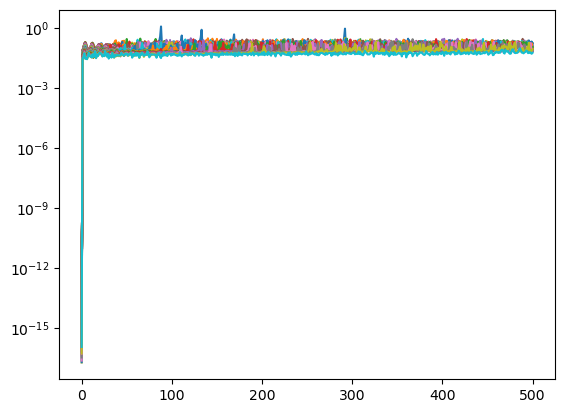

In [118]:
for i in range(50):
    plt.plot(amplitude_std_all[:, -1,i])

plt.yscale("log")

In [49]:
rr, aa, xa, ya = np.meshgrid(radiuses, angles, x_angles_samples, y_angles_samples)
rr.shape

(50, 10, 50, 50)

In [138]:
amp_x = np.sqrt(x_list**2 + px_list**2)
amp_y = np.sqrt(y_list**2 + py_list**2)
amp_all = np.sqrt(x_list**2 + px_list**2 + y_list**2 + py_list**2)

(array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.28188865,
         0.        ,  0.        ,  0.        ,  0.        ,  0.28188865,
         0.        ,  0.56377731,  0.        ,  0.56377731,  0.28188865,
         0.        ,  0.28188865,  0.28188865,  0.        ,  0.84566596,
         1.12755462,  1.12755462,  3.94644116,  7.329105  , 11.83932347,
        13.81254405, 20.29598309, 16.34954193, 14.65821001, 12.96687808,
        15.50387597, 10.71176885, 15.78576462, 17.7589852 , 26.21564482,
        21.14164905, 23.67864693, 20.85976039, 22.26920366, 22.55109232,
        18.32276251, 13.81254405, 10.99365751,  5.07399577,  8.17477097,
         3.6645525 ,  4.79210712,  5.07399577,  4.22832981,  3.38266385,
         1.69133192,  1.69133192,  3.10077519,  1.97322058,  1.40944327,
         1.12755462,  2.53699789,  0.84566596,  1.1

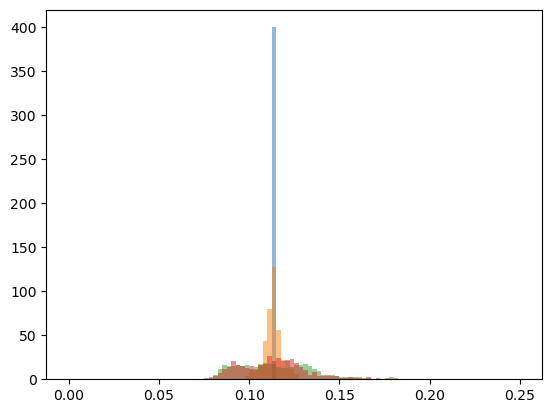

In [117]:
plt.hist(amp_x[0,5,25].flatten(), bins=100, range=(0,0.25), alpha=0.5, density=True)
plt.hist(amp_x[1,5,25].flatten(), bins=100, range=(0,0.25), alpha=0.5, density=True)
plt.hist(amp_x[-20,5,25].flatten(), bins=100, range=(0,0.25), alpha=0.5, density=True)
# plt.hist(amp_x[-10,5,25].flatten(), bins=100, range=(0,0.25), alpha=0.5, density=True)
plt.hist(amp_x[-1,5,25].flatten(), bins=100, range=(0,0.25), alpha=0.5, density=True)

In [94]:
plt.plot(np.nanstd(amp_x[:,5,25],axis=(-1,-2))/np.arange(1,amp_x.shape[0]+1))
plt.plot(np.nanstd(amp_x[:,6,25],axis=(-1,-2))/np.arange(1,amp_x.shape[0]+1))
plt.plot(np.nanstd(amp_x[:,-1,25],axis=(-1,-2))/np.arange(1,amp_x.shape[0]+1))
plt.plot(np.nanstd(amp_x[:,0,25],axis=(-1,-2))/np.arange(1,amp_x.shape[0]+1))
plt.yscale("log")
plt.xscale("log")

NameError: name 'amp_x' is not defined

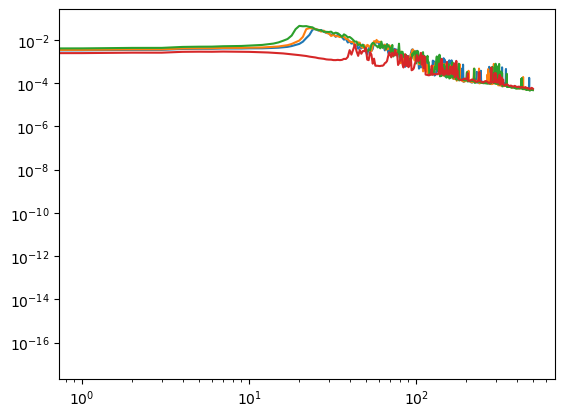

In [139]:
plt.plot(np.nanstd(amp_y[:,5,25],axis=(-1,-2))/np.arange(1,amp_y.shape[0]+1))
plt.plot(np.nanstd(amp_y[:,6,25],axis=(-1,-2))/np.arange(1,amp_y.shape[0]+1))
plt.plot(np.nanstd(amp_y[:,-1,25],axis=(-1,-2))/np.arange(1,amp_y.shape[0]+1))
plt.plot(np.nanstd(amp_y[:,0,25],axis=(-1,-2))/np.arange(1,amp_y.shape[0]+1))
plt.yscale("log")
plt.xscale("log")

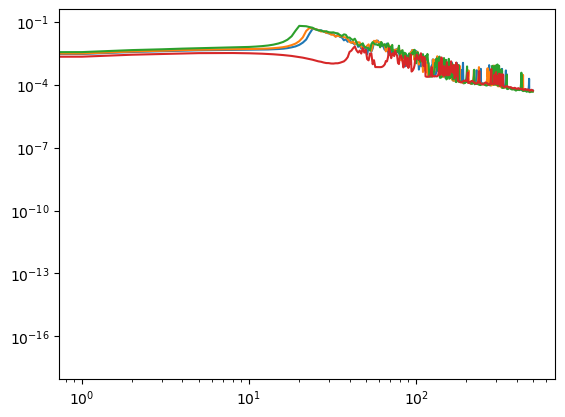

In [140]:
plt.plot(np.nanstd(amp_all[:,5,25],axis=(-1,-2))/np.arange(1,amp_all.shape[0]+1))
plt.plot(np.nanstd(amp_all[:,6,25],axis=(-1,-2))/np.arange(1,amp_all.shape[0]+1))
plt.plot(np.nanstd(amp_all[:,-1,25],axis=(-1,-2))/np.arange(1,amp_all.shape[0]+1))
plt.plot(np.nanstd(amp_all[:,0,25],axis=(-1,-2))/np.arange(1,amp_all.shape[0]+1))
plt.yscale("log")
plt.xscale("log")

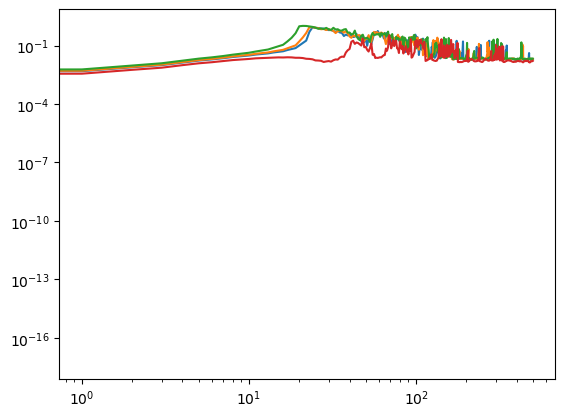

In [127]:
plt.plot(np.nanstd(amp_x[:,5,25],axis=(-1,-2)))
plt.plot(np.nanstd(amp_x[:,6,25],axis=(-1,-2)))
plt.plot(np.nanstd(amp_x[:,-1,25],axis=(-1,-2)))
plt.plot(np.nanstd(amp_x[:,0,25],axis=(-1,-2)))
plt.yscale("log")
plt.xscale("log")

In [144]:
alive[-1]

array([[2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500],
       [2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500],
       [2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500,
        2500, 2500, 25

In [128]:
from matplotlib.animation import FuncAnimation

/tmp/ipykernel_29202/145877569.py:27: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  where_am_i.set_xdata(frame)


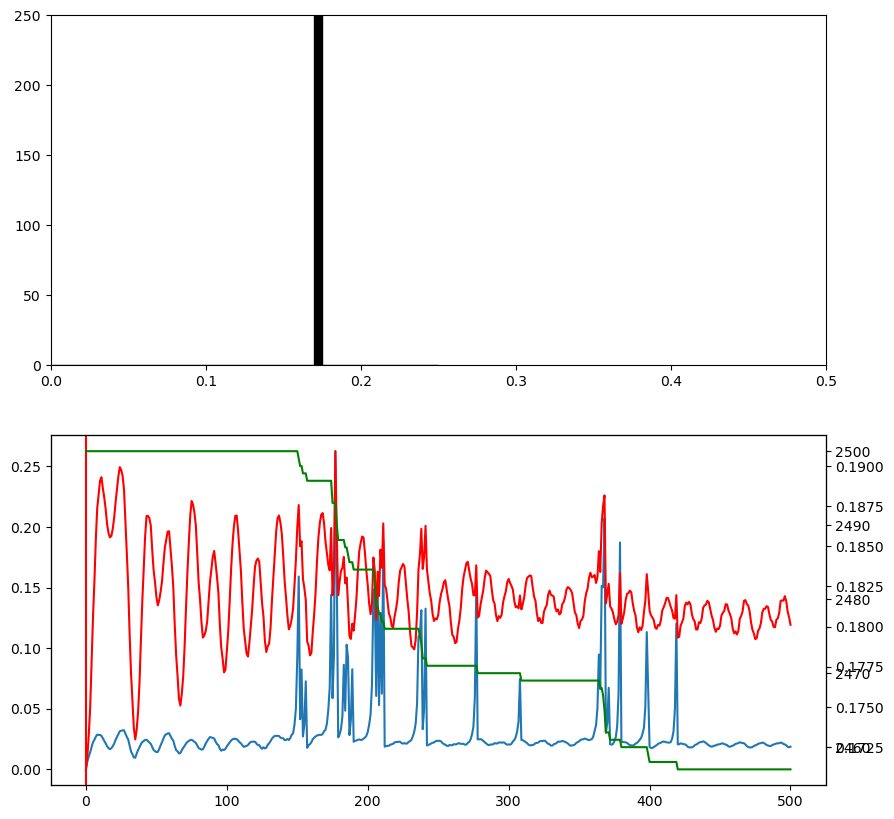

In [170]:
fig, ax = plt.subplots(2, 1, figsize=(10, 10))
num_bins = 50  # Number of bins in the histogram

# Set up the bar plot (initially empty)
ax[0].set_ylim(0, 250)
ax[0].set_xlim(0, 0.5)  # Set the y-axis limit based on the maximum value in the data

bins = np.linspace(0, 0.25, num_bins + 1)
bin_centers = 0.5 * (bins[:-1] + bins[1:])
bars = ax[0].bar(bin_centers, np.zeros(num_bins), width=bins[1] - bins[0], color='k', edgecolor='k')

ax[1].plot(np.nanstd(amp_all[:,7, 7],axis=(-1,-2)))
ax2 = ax[1].twinx()
ax2.plot(np.nanmean(amp_all[:,7, 7],axis=(-1,-2)),color='r')
ax3 = ax[1].twinx()
ax3.plot(np.count_nonzero(~np.isnan(amp_all[:,7, 7]),axis=(-1,-2)),color='g')

where_am_i = ax[1].axvline(0, color='r')

def update(frame):
    # Update the heights of the bars with the data from the current frame (row in the 2D array)
    counts, _ = np.histogram(amp_all[frame,7, 7].flatten(), bins)
    for bar, h in zip(bars, counts):
        bar.set_height(h)

    # Update the position of the red line
    where_am_i.set_xdata(frame)

    # update ylim so that the y-axis is always large enough to show the maximum value
    return bars

# The animation will loop through each row of the 2D array (each frame corresponds to a histogram at a certain time)
animation = FuncAnimation(fig, update, frames=100)

from IPython.display import HTML
HTML(animation.to_jshtml())


In [134]:
np.histogram(amp_x[0,5,25].flatten(), bins)

(array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
        2500,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0]),
 array([0.   , 0.005, 0.01 , 0.015, 0.02 , 0.025, 0.03 , 0.035, 0.04 ,
        0.045, 0.05 , 0.055, 0.06 , 0.065, 0.07 , 0.075, 0.08 , 0.085,
        0.09 , 0.095, 0.1  , 0.105, 0.11 , 0.115, 0.12 , 0.125, 0.13 ,
        0.135, 0.14 , 0.145, 0.15 , 0.155, 0.16 , 0.165, 0.17 , 0.175,
        0.18 , 0.185, 0.19 , 0.195, 0.2  , 0.205, 0.21 , 0.215, 0.22 ,
        0.225, 0.23 , 0.235, 0.24 , 0.245, 0.25 ]))

In [184]:
ANGULAR_SAMPLES = 3
EXTRA_ANGULAR_SAMPLES = 50
LINEAR_SAMPLES = 10

R_MIN = 0.10
R_MAX = 0.19

PRE_TURNS = 0
TURNS = 10000

In [191]:
angles = np.linspace(0, np.pi / 2, ANGULAR_SAMPLES)
radiuses = np.linspace(R_MIN, R_MAX, LINEAR_SAMPLES)

x_angles_samples = np.linspace(0, 2*np.pi, EXTRA_ANGULAR_SAMPLES)
y_angles_samples = np.linspace(0, 2*np.pi, EXTRA_ANGULAR_SAMPLES)

rr, aa, xa, ya = np.meshgrid(radiuses, angles, x_angles_samples, y_angles_samples, indexing='ij')

xx = rr * np.cos(aa) * np.cos(xa)
x = xx.flatten()
px = rr * np.cos(aa) * np.sin(xa)
px = px.flatten()
yy = rr * np.sin(aa) * np.cos(ya)
y = yy.flatten()
py = rr * np.sin(aa) * np.sin(ya)
py = py.flatten()

In [192]:
np.sqrt(x**2 + px**2 + y**2 + py**2)

array([0.1 , 0.1 , 0.1 , ..., 0.19, 0.19, 0.19])

In [193]:
particles = hm.particles(x, px, y, py)

# start chronometer
start = datetime.datetime.now()

tracker = hm.henon_tracker(MAX_TURNS, OMEGA_X, OMEGA_Y, "sps", epsilon=EPSILON)

if PRE_TURNS > 0:
    tracker.track(particles, PRE_TURNS, mu=MU, barrier=10.0)

x_list = []
px_list = []
y_list = []
py_list = []

amplitude_std_x = []
amplitude_std_y = []
amplitude_std_all = []
alive = []

t_x = particles.get_x()
t_px = particles.get_px()
t_y = particles.get_y()
t_py = particles.get_py()
t_steps = particles.get_steps()

t_x = t_x.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
t_px = t_px.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
t_y = t_y.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
t_py = t_py.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
t_steps = t_steps.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))

x_list.append(t_x)
px_list.append(t_px)
y_list.append(t_y)
py_list.append(t_py)

amplitude_std_x.append(np.nanstd(np.sqrt(t_x**2 + t_px**2), axis=(-1, -2)))
amplitude_std_y.append(np.nanstd(np.sqrt(t_y**2 + t_py**2), axis=(-1, -2)))
amplitude_std_all.append(np.nanstd(np.sqrt(t_x**2 + t_px**2 + t_y**2 + t_py**2), axis=(-1, -2)))
alive.append(np.count_nonzero(t_steps, axis=(-1, -2)))

for i in tqdm(range(PRE_TURNS, TURNS)):
    tracker.track(particles, 1, mu=MU, barrier=10.0)
    t_x = particles.get_x()
    t_px = particles.get_px()
    t_y = particles.get_y()
    t_py = particles.get_py()
    t_steps = particles.get_steps()

    t_x = t_x.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
    t_px = t_px.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
    t_y = t_y.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
    t_py = t_py.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))
    t_steps = t_steps.reshape((LINEAR_SAMPLES, ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES, EXTRA_ANGULAR_SAMPLES))

    x_list.append(t_x)
    px_list.append(t_px)
    y_list.append(t_y)
    py_list.append(t_py)

    amplitude_std_x.append(np.nanstd(np.sqrt(t_x**2 + t_px**2), axis=(-1, -2)))
    amplitude_std_y.append(np.nanstd(np.sqrt(t_y**2 + t_py**2), axis=(-1, -2)))
    amplitude_std_all.append(np.nanstd(np.sqrt(t_x**2 + t_px**2 + t_y**2 + t_py**2), axis=(-1, -2)))
    alive.append(np.count_nonzero(t_steps < i+1, axis=(-1, -2)))

x_list = np.array(x_list)
px_list = np.array(px_list)
y_list = np.array(y_list)
py_list = np.array(py_list)

amplitude_std_x = np.array(amplitude_std_x)
amplitude_std_y = np.array(amplitude_std_y)
amplitude_std_all = np.array(amplitude_std_all)
alive = np.array(alive)
alive = 2500 - alive


creating gpu tracker


  0%|          | 0/10000 [00:00<?, ?it/s]

/home/HPC/camontan/anaconda3/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


In [194]:
amp_x = np.sqrt(x_list**2 + px_list**2)
amp_y = np.sqrt(y_list**2 + py_list**2)
amp_all = np.sqrt(x_list**2 + px_list**2 + y_list**2 + py_list**2)

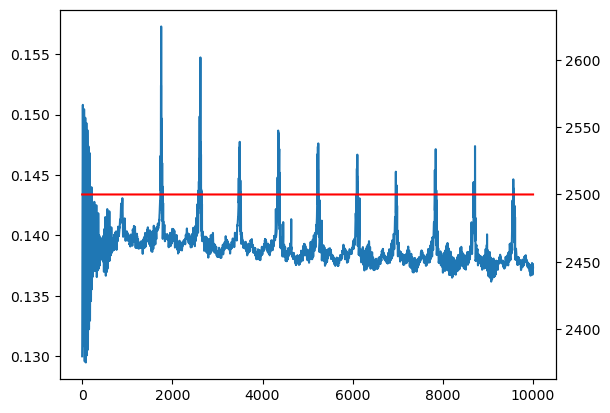

In [212]:
# plt.plot(np.nanstd(amp_all[:, 0, 1], axis=(-1, -2)))
# plt.plot(np.nanstd(amp_all[:, 2, 1], axis=(-1, -2))/np.arange(1, amp_all.shape[0]+1))
plt.plot(np.nanmean(amp_all[:, 3, 1], axis=(-1, -2)))
# plt.xscale("log")
# plt.yscale("log")
plt.twinx()
plt.plot(alive[:, 2, 1], color="red")

<Axes: >

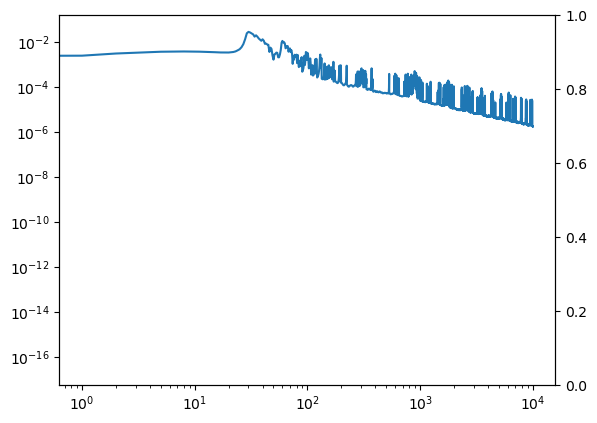

In [206]:
# plt.plot(np.nanstd(amp_all[:, 0, 1], axis=(-1, -2)))
plt.plot(np.nanstd(amp_all[:, 5, 1], axis=(-1, -2))/np.arange(1, amp_all.shape[0]+1))
plt.xscale("log")
plt.yscale("log")
plt.twinx()
# plt.plot(alive[:, 3, 1], color="red")

In [196]:
alive[:, 0, 1]

array([2500, 2500, 2500, ..., 2500, 2500, 2500])

In [2]:
epsilon = 1e-5
kappa = 0.9

@njit
def bazzani_map(i, th, j, phi):
    i_n = i - epsilon * np.sin(th + phi)
    th_n = np.mod(th + i_n, 2 * np.pi)
    j_n = j + kappa * np.sin(phi)
    phi_n = np.mod(phi + j_n, 2 * np.pi)
    return i_n, th_n, j_n, phi_n


@njit(parallel=True)
def unstable_map(i, th, j, phi):
    i_n = i - epsilon * np.sin(th + phi)
    th_n = np.mod(th + i_n, 2 * np.pi)
    j_n = j + kappa * np.sin(phi) - epsilon * np.sin(th + phi)
    phi_n = np.mod(phi + j_n, 2 * np.pi)
    return i_n, th_n, j_n, phi_n

I_vals = np.linspace(0, 6, 200)
d_val = []
for val in tqdm(I_vals):

    j_list = np.ones(100000) * 0.5
    phi_list = np.linspace(0.1, 0.4, 100000)
    i_list = np.ones_like(j_list) * val
    th_list = np.zeros_like(j_list)

    std_values = []

    for t in (range(500)):
        i_list, th_list, j_list, phi_list = unstable_map(i_list, th_list, j_list, phi_list)

        std_values.append(np.std(i_list))

    std_values = np.array(std_values)
    d_val.append(std_values[-1])

  0%|          | 0/200 [00:00<?, ?it/s]

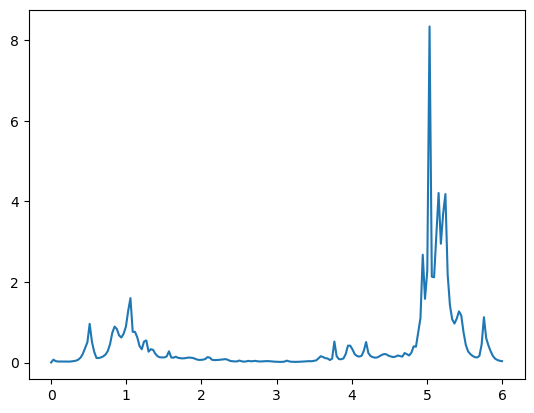

In [3]:
plt.plot(I_vals, np.asarray(d_val)**2 / (epsilon**2 * 500))

Text(0, 0.5, '$\\langle(I_N - \\langle I_N\\rangle)^2\\rangle$')

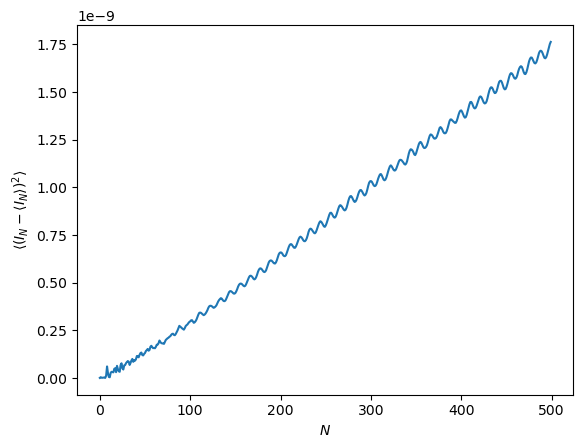

In [7]:
plt.plot(std_values**2)
plt.xlabel('$N$')
plt.ylabel('$\\langle(I_N - \\langle I_N\\rangle)^2\\rangle$')

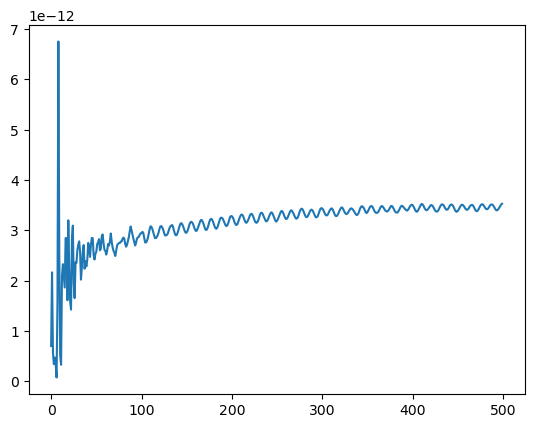

In [156]:
plt.plot(std_values**2 / np.arange(1, len(std_values) + 1))

(array([2.21942443e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 2.21942443e-01,
        2.21942443e-01, 0.00000000e+00, 0.00000000e+00, 2.21942443e-01,
        2.21942443e-01, 6.65827329e-01, 6.65827329e-01, 0.00000000e+00,
        2.21942443e-01, 2.21942443e+00, 2.44136687e+00, 6.65827329e-01,
        3.10719420e+00, 3.10719420e+00, 3.99496398e+00, 5.54856108e+00,
        6.21438841e+00, 8.43381284e+00, 7.54604307e+00, 1.04312948e+01,
        1.48701437e+01, 1.68676257e+01, 2.30820141e+01, 2.10845321e+01,
        3.37352514e+01, 3.88399275e+01, 4.61640282e+01, 5.45978410e+01,
        7.30190638e+01, 7.87895673e+01, 9.16622290e+01, 1.17407552e+02,
        1.43596761e+02, 1.76000357e+02, 2.06850357e+02, 2.46134169e+02,
        2.87193521e+02, 3.31582010e+02, 3.78189923e+02, 4.90936684e+02,
        6.28762941e+02, 7.97439198e+02, 1.16186869e+03, 1.57024279e+03,
        1.98394350e+03, 2.34837299e+03, 2.29000213e+03, 1.957310

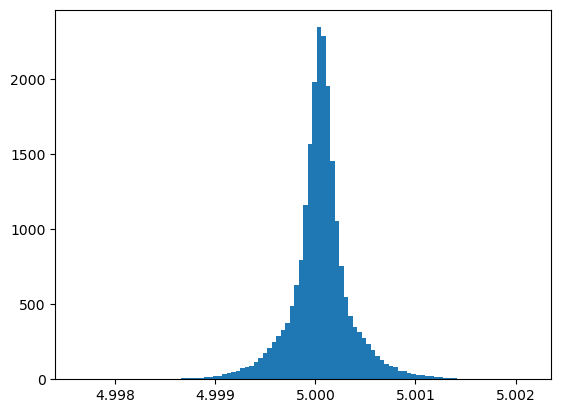

In [69]:
plt.hist(i_list, bins=100, density=True, label='i')

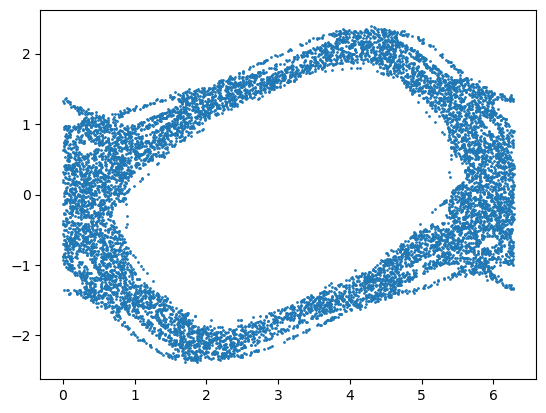

In [36]:
plt.scatter(phi_list, j_list, s=1)

In [34]:
i_list

array([-2.63433149e-08, -3.09995732e-08, -3.56391706e-08, ...,
       -6.71309713e-08, -6.34501057e-08, -5.95545098e-08])

In [131]:
OMEGA_X = 0.168 # 0.168
OMEGA_Y = 0.201 # 0.201
EPSILON = 64.0
MU = 0.00

ANGULAR_SAMPLES = 100
LINEAR_SAMPLES = 100

R_MAX = 0.75

MAX_TURNS = int(1e5)


In [160]:
ANGULAR_SAMPLES = 5
SAMPLES_PER_POINT = 1000
LINEAR_SAMPLES = 3

R_MIN = 0.5
R_MAX = 0.7

PRE_TURNS = 0
TURNS = 100000

ACTION_SPREAD = 0.01
ANGLE_SPREAD = 0.1


In [161]:
angle = 0.25 * np.pi
action = np.sqrt(0.4**2)

spread_actions = np.random.normal(0, ACTION_SPREAD, SAMPLES_PER_POINT)
spread_angles = np.random.normal(0, ANGLE_SPREAD, SAMPLES_PER_POINT)
# spread_angles = np.random.uniform(-np.pi, +np.pi, SAMPLES_PER_POINT)

x = (action + spread_actions) * np.cos(angle) * np.cos(spread_angles)
px = (action + spread_actions) * np.cos(angle) * np.sin(spread_angles)
y = (action + spread_actions) * np.sin(angle) * np.cos(spread_angles)
py = (action + spread_actions) * np.sin(angle) * np.sin(spread_angles)

x = x.flatten()
px = px.flatten()
y = y.flatten()
py = py.flatten()

0.010071763830520148

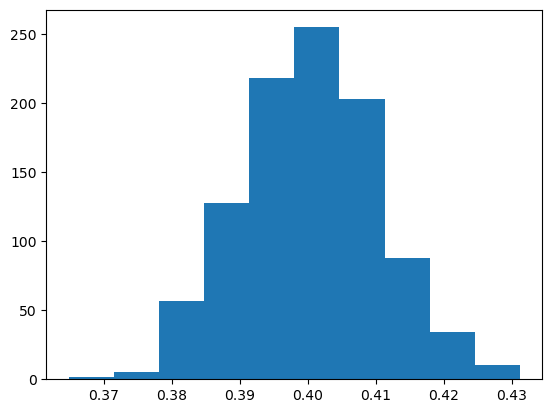

In [162]:
plt.hist(np.sqrt(x**2 + px**2 + y**2 + py**2))
np.std(np.sqrt(x**2 + px**2 + y**2 + py**2))

In [171]:
particles = hm.particles(x, px, y, py, force_CPU=False)

# start chronometer
start = datetime.datetime.now()

tracker = hm.henon_tracker(TURNS, OMEGA_X, OMEGA_Y, "sps", epsilon=EPSILON, force_CPU=False)

actions = []
angle_x = []
angle_y = []
actions.append(
        np.sqrt(particles.get_x()**2 + particles.get_px()**2 + particles.get_y()**2 + particles.get_py()**2)
    )
angle_x.append(np.arctan2(particles.get_px(), particles.get_x()))
angle_y.append(np.arctan2(particles.get_py(), particles.get_y()))
for i in tqdm(range(TURNS)):
    tracker.track(particles, 1, mu=MU, barrier=10.0)
    actions.append(
        np.sqrt(particles.get_x()**2 + particles.get_px()**2 + particles.get_y()**2 + particles.get_py()**2)
    )
    angle_x.append(np.arctan2(particles.get_px(), particles.get_x()))
    angle_y.append(np.arctan2(particles.get_py(), particles.get_y()))
# tracker.track(particles, TURNS, mu=MU, barrier=10.0)

steps = particles.get_steps()
actions = np.asarray(actions)
angle_x = np.asarray(angle_x)
angle_y = np.asarray(angle_y)

creating gpu tracker


  0%|          | 0/100000 [00:00<?, ?it/s]

In [172]:
particles = hm.particles(x, px, y, py, force_CPU=False)
np.nanstd(np.sqrt(particles.get_x()**2 + particles.get_px()**2 + particles.get_y()**2 + particles.get_py()**2))

0.010071763830520148

In [173]:
actions

array([[0.40562834, 0.41238125, 0.39449622, ..., 0.3873265 , 0.39532536,
        0.4088259 ],
       [0.43505786, 0.44339701, 0.41114679, ..., 0.41154179, 0.43576148,
        0.43907061],
       [0.41157834, 0.41882511, 0.38911115, ..., 0.39073051, 0.42009094,
        0.4150936 ],
       ...,
       [0.47698501, 0.44042405, 0.4544513 , ..., 0.35762645, 0.45377236,
               nan],
       [0.4326348 , 0.40233651, 0.4345505 , ..., 0.35741129, 0.46270122,
               nan],
       [0.42490818, 0.41833541, 0.40980103, ..., 0.3844077 , 0.46324308,
               nan]])

(array([ 21., 135., 208., 205., 142.,  39.,  10.,   4.,   1.,   2.]),
 array([0.31685901, 0.35703042, 0.39720183, 0.43737324, 0.47754465,
        0.51771606, 0.55788747, 0.59805888, 0.63823029, 0.6784017 ,
        0.71857311]),
 <BarContainer object of 10 artists>)

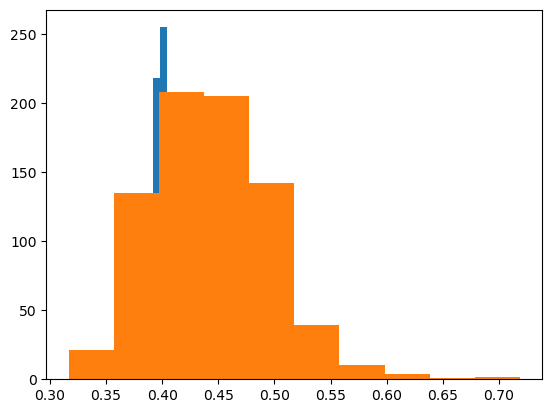

In [174]:
plt.hist(actions[0])
plt.hist(actions[-1])

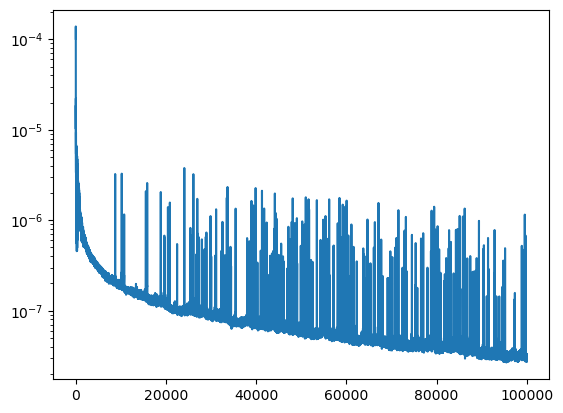

In [175]:
plt.plot(
    np.nanstd(actions, axis=1)**2 / np.arange(1, actions.shape[0] + 1),
)

plt.yscale("log")

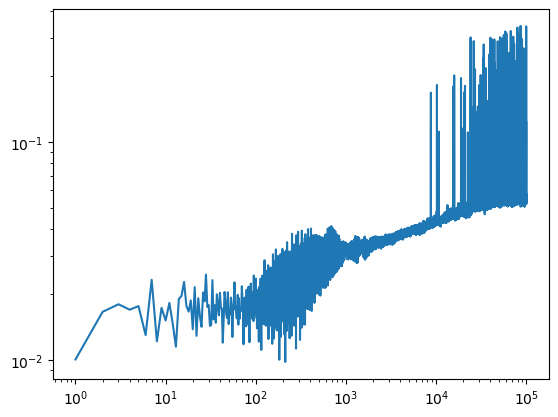

In [176]:
plt.plot(
    np.arange(1, actions.shape[0] + 1), np.nanstd(actions, axis=1)
)

plt.yscale("log")
plt.xscale("log")

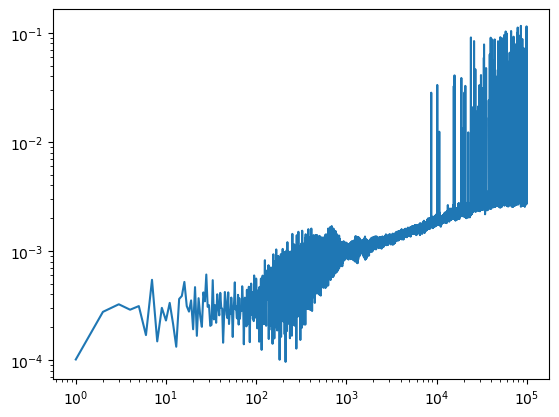

In [177]:
plt.plot(
    np.arange(1, actions.shape[0] + 1), np.nanstd(actions, axis=1)**2
)

plt.yscale("log")
plt.xscale("log")

(array([ 7., 12., 14., 11.,  7.,  9., 12.,  3.,  8.,  6., 15., 10.,  4.,
         9.,  7.,  9.,  8.,  5., 10.,  6.,  9.,  6.,  9.,  4.,  4.,  7.,
         7.,  7.,  9.,  7.,  8., 11.,  6., 10.,  6.,  3., 12., 12.,  6.,
        17., 10., 15., 13., 13., 13.,  6.,  6.,  9.,  7., 10.,  5., 12.,
        11.,  8.,  6.,  7.,  5.,  8.,  8.,  5.,  7.,  7.,  8.,  7.,  7.,
        12.,  9., 10.,  8.,  7.,  6.,  4., 12.,  6.,  9., 11., 11., 12.,
         3.,  2.,  6.,  6.,  7.,  3.,  6.,  5.,  5.,  6.,  5.,  7.,  3.,
         7.,  5.,  6.,  3.,  3.,  9.,  8.,  8.,  8.]),
 array([-3.13660941e+00, -3.07384175e+00, -3.01107409e+00, -2.94830643e+00,
        -2.88553876e+00, -2.82277110e+00, -2.76000344e+00, -2.69723578e+00,
        -2.63446811e+00, -2.57170045e+00, -2.50893279e+00, -2.44616512e+00,
        -2.38339746e+00, -2.32062980e+00, -2.25786214e+00, -2.19509447e+00,
        -2.13232681e+00, -2.06955915e+00, -2.00679148e+00, -1.94402382e+00,
        -1.88125616e+00, -1.81848850e+00, -1.75572083e

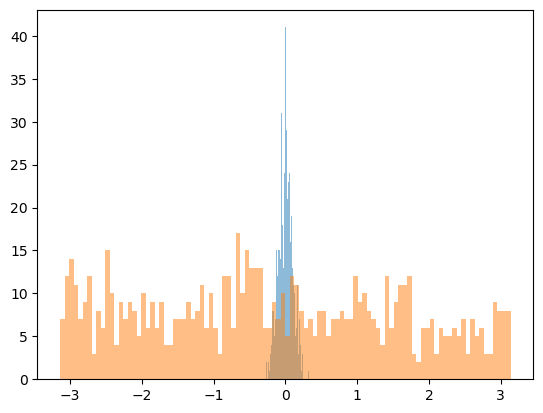

In [141]:
plt.hist(angle_x[0], alpha=0.5, bins=100, label='x')
plt.hist(angle_x[-1], alpha=0.5, bins=100, label='y')

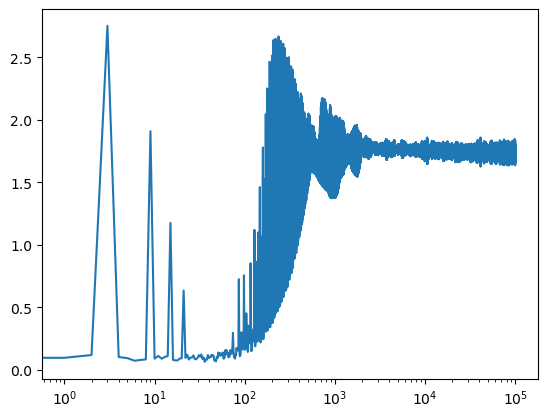

In [142]:
plt.plot(np.nanstd(angle_x, axis=1))
plt.xscale('log')

(array([  1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,
          0.,   0.,   0.,   1.,   1.,   0.,   1.,   0.,   4.,   2.,   1.,
          0.,   4.,   6.,   2.,   6.,   2.,   3.,   4.,   2.,   7.,   8.,
          6.,  12.,   7.,   9.,   6.,   3.,   7.,   9.,  13.,   7.,  13.,
         13.,   9.,  16.,   8.,  12., 794.]),
 array([3.97941178, 3.99982355, 4.02023531, 4.04064708, 4.06105884,
        4.0814706 , 4.10188237, 4.12229413, 4.1427059 , 4.16311766,
        4.18352943, 4.20394119, 4.22435295, 4.24476472, 4.26517648,
        4.28558825, 4.30600001, 4.32641178, 4.34682354, 4.36723531,
        4.38764707, 4.40805883, 4.4284706 , 4.44888236, 4.46929413,
        4.48970589, 4.51011766, 4.53052942, 4.55094118, 4.57135295,
        4.59176471, 4.61217648, 4.63258824, 4.65300001, 4.67341177,
        4.69382353, 4.7142353 , 4.73464706, 4.75505883, 4.77547059,
        4.79588236, 4.81629412, 4.83670589, 4.85711765, 4.87752941,
        4.89794118, 4.91835294, 4.93876471, 4.

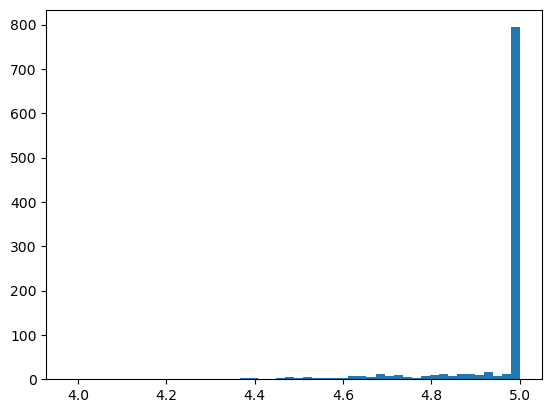

In [143]:
plt.hist(np.log10(steps).flatten(), bins=50)

In [68]:
np.unique(steps)

array([ 80881,  91911,  92893,  95191, 100000])

In [186]:
various_stds = []
various_stds_angle_x = []
various_stds_angle_y = []
various_steps = []

for a in tqdm(np.linspace(0.3, 0.55, 10)):
    angle = 0.25 * np.pi
    action = a

    spread_actions = np.random.normal(0, ACTION_SPREAD, SAMPLES_PER_POINT)
    spread_angles = np.random.normal(0, ANGLE_SPREAD, SAMPLES_PER_POINT)
    # spread_angles = np.random.uniform(-np.pi, +np.pi, SAMPLES_PER_POINT)

    x = (action + spread_actions) * np.cos(angle) * np.cos(spread_angles)
    px = (action + spread_actions) * np.cos(angle) * np.sin(spread_angles)
    y = (action + spread_actions) * np.sin(angle) * np.cos(spread_angles)
    py = (action + spread_actions) * np.sin(angle) * np.sin(spread_angles)

    x = x.flatten()
    px = px.flatten()
    y = y.flatten()
    py = py.flatten()

    particles = hm.particles(x, px, y, py, force_CPU=False)

    tracker = hm.henon_tracker(TURNS, OMEGA_X, OMEGA_Y, "sps", epsilon=EPSILON, force_CPU=False)

    actions = []
    angle_x = []
    angle_y = []
    actions.append(
            np.sqrt(particles.get_x()**2 + particles.get_px()**2 + particles.get_y()**2 + particles.get_py()**2)
        )
    angle_x.append(np.arctan2(particles.get_px(), particles.get_x()))
    angle_y.append(np.arctan2(particles.get_py(), particles.get_y()))
    for i in tqdm(range(TURNS)):
        tracker.track(particles, 1, mu=MU, barrier=10.0)
        actions.append(
            np.sqrt(particles.get_x()**2 + particles.get_px()**2 + particles.get_y()**2 + particles.get_py()**2)
        )
        angle_x.append(np.arctan2(particles.get_px(), particles.get_x()))
        angle_y.append(np.arctan2(particles.get_py(), particles.get_y()))
    # tracker.track(particles, TURNS, mu=MU, barrier=10.0)

    steps = particles.get_steps()
    actions = np.asarray(actions)
    angle_x = np.asarray(angle_x)
    angle_y = np.asarray(angle_y)

    various_stds.append(np.nanstd(actions, axis=1)**2)
    various_stds_angle_x.append(np.nanstd(angle_x, axis=1))
    various_stds_angle_y.append(np.nanstd(angle_y, axis=1))
    various_steps.append(steps)

  0%|          | 0/10 [00:00<?, ?it/s]

creating gpu tracker


  0%|          | 0/100000 [00:00<?, ?it/s]

creating gpu tracker


  0%|          | 0/100000 [00:00<?, ?it/s]

creating gpu tracker


  0%|          | 0/100000 [00:00<?, ?it/s]

creating gpu tracker


  0%|          | 0/100000 [00:00<?, ?it/s]

creating gpu tracker


  0%|          | 0/100000 [00:00<?, ?it/s]

creating gpu tracker


  0%|          | 0/100000 [00:00<?, ?it/s]

creating gpu tracker


  0%|          | 0/100000 [00:00<?, ?it/s]

creating gpu tracker


  0%|          | 0/100000 [00:00<?, ?it/s]

creating gpu tracker


  0%|          | 0/100000 [00:00<?, ?it/s]

creating gpu tracker


  0%|          | 0/100000 [00:00<?, ?it/s]

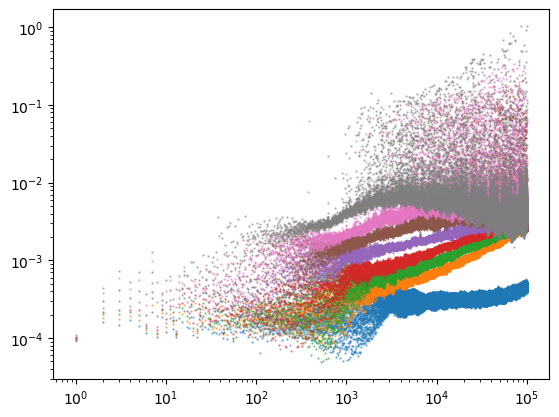

In [190]:
for std in various_stds[:-2]:
    plt.scatter(np.arange(1, std.shape[0] + 1), std, label=f"std={std}", s=0.5, alpha=0.5)

plt.yscale("log")
plt.xscale("log")

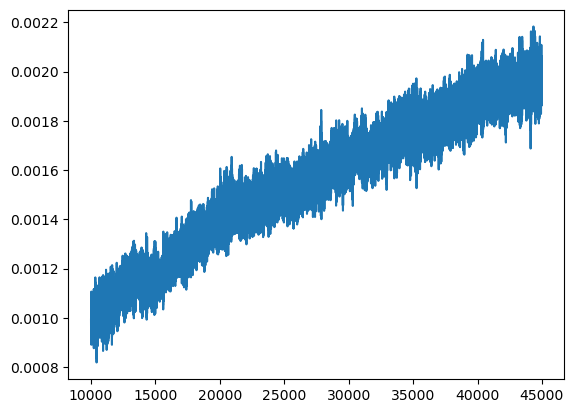

In [220]:
plt.plot(np.arange(1, std.shape[0] + 1)[10000:45000], various_stds[2][10000:45000], label=f"std={std}")

# plt.yscale("log")
# plt.xscale("log")

In [212]:
np.arange(1, std.shape[0] + 1)

array([     1,      2,      3, ...,  99999, 100000, 100001])

In [198]:
various_steps = []
tracker = hm.henon_tracker(int(1e6), OMEGA_X, OMEGA_Y, "sps", epsilon=EPSILON, force_CPU=False)

for a in tqdm(np.linspace(0.3, 0.55, 30)):
    angle = 0.25 * np.pi
    action = a

    spread_actions = np.random.normal(0, ACTION_SPREAD, SAMPLES_PER_POINT)
    spread_angles = np.random.normal(0, ANGLE_SPREAD, SAMPLES_PER_POINT)
    # spread_angles = np.random.uniform(-np.pi, +np.pi, SAMPLES_PER_POINT)

    x = (action + spread_actions) * np.cos(angle) * np.cos(spread_angles)
    px = (action + spread_actions) * np.cos(angle) * np.sin(spread_angles)
    y = (action + spread_actions) * np.sin(angle) * np.cos(spread_angles)
    py = (action + spread_actions) * np.sin(angle) * np.sin(spread_angles)

    x = x.flatten()
    px = px.flatten()
    y = y.flatten()
    py = py.flatten()

    particles = hm.particles(x, px, y, py, force_CPU=False)


    tracker.track(particles, int(1e6), mu=MU, barrier=10.0)

    steps = particles.get_steps()
    various_steps.append(steps)

creating gpu tracker


  0%|          | 0/30 [00:00<?, ?it/s]

(array([ 4.,  2.,  2.,  1.,  5.,  3.,  9.,  4.,  6.,  5.,  8., 11., 15.,
        18., 17., 21., 24., 33., 33., 23., 26., 29., 26., 40., 29., 27.,
        25., 34., 34., 30., 24., 30., 21., 20., 25., 17., 21., 23., 21.,
        20., 15., 14., 22., 18., 22., 13., 14., 10., 13., 93.]),
 array([3.5939503 , 3.64207129, 3.69019228, 3.73831328, 3.78643427,
        3.83455527, 3.88267626, 3.93079725, 3.97891825, 4.02703924,
        4.07516024, 4.12328123, 4.17140222, 4.21952322, 4.26764421,
        4.31576521, 4.3638862 , 4.41200719, 4.46012819, 4.50824918,
        4.55637018, 4.60449117, 4.65261217, 4.70073316, 4.74885415,
        4.79697515, 4.84509614, 4.89321714, 4.94133813, 4.98945912,
        5.03758012, 5.08570111, 5.13382211, 5.1819431 , 5.23006409,
        5.27818509, 5.32630608, 5.37442708, 5.42254807, 5.47066906,
        5.51879006, 5.56691105, 5.61503205, 5.66315304, 5.71127404,
        5.75939503, 5.80751602, 5.85563702, 5.90375801, 5.95187901,
        6.        ]),
 <BarContainer

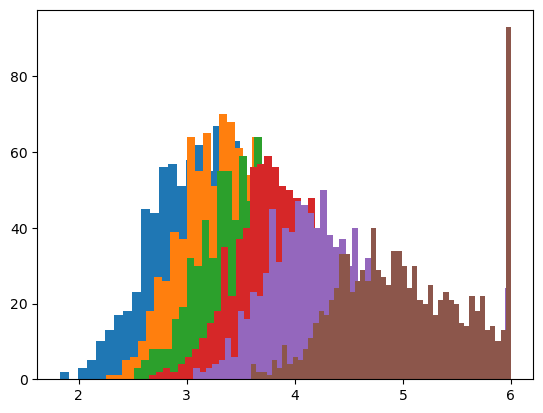

In [204]:
plt.hist(np.log10(various_steps[-1]).flatten(), bins=50)
plt.hist(np.log10(various_steps[-3]).flatten(), bins=50)
plt.hist(np.log10(various_steps[-5]).flatten(), bins=50)
plt.hist(np.log10(various_steps[-7]).flatten(), bins=50)
plt.hist(np.log10(various_steps[-10]).flatten(), bins=50)
plt.hist(np.log10(various_steps[-15]).flatten(), bins=50)

In [199]:
from numba import njit, cfunc, carray
from numba.types import intc, CPointer, float64

In [ ]:
def integrand(t):
    return np.exp(-t) / t**2

nb_integrand = cfunc("float64(float64)")(integrand)

def do_integrate(func, a, b):
    return integrate.quad(func, a, b)[0]


def inverse_nek_d(kappa, I_ast, I):
    return 1 / np.exp(-2 * (I_ast/I) ** (1 / (2*kappa)))


@njit
def inverse_nek_d_numba(kappa, I_ast, I):
    return 1 / np.exp(-2 * (I_ast/I) ** (1 / (2*kappa)))

def specific_inverse_nek_d(I):
    return 1 / np.exp(-2 * (40.0/I) ** (1 / (2*0.5)))

inverse_nek_d_ctype = cfunc("float64(float64)")(specific_inverse_nek_d)
inverse_nek_d_ctype_bis = cfunc("float64(float64)")(lambda x: inverse_nek_d_numba(0.5, 40, x))


In [ ]:
@njit
def nek_d(kappa, I_ast, I):
    return np.exp(-2 * (I_ast/I) ** (1 / (2*kappa)))


@njit
def inverse_nek_d(kappa, I_ast, I):
    return 1 / np.exp(-2 * (I_ast/I) ** (1 / (2*kappa)))


@njit
def nu(kappa, I_ast, I):
    return (1 / (2*kappa)) * (1 / I) * (I_ast / I)**(1 / (2*kappa)) * np.exp(-(I_ast / I)**(1 / (2*kappa)))


def I_to_x(I, I_a, func_nek):
    # if I is a scalar
    if np.isscalar(I):
        return -do_integrate(func_nek, I, I_a)
    # if I is an array
    else:
        return np.array([-do_integrate(func_nek, i, I_a) for i in I])
    

def ja(I, I_a, t, func_nek, kappa, I_ast):
    return np.abs(I_to_x(I, I_a, func_nek)) / (t * np.sqrt(2*np.pi*t)) * np.exp(-(I_to_x(I, I_a, func_nek) + (nu(kappa, I_ast, I) * t))**2 / (2*t))


@njit
def outward_dist(A, Ia, Ib, I):
    if I < Ia:
        return A
    elif I > Ia:
        return A * ((Ib - I) / (Ib - Ia))
    else:
        return 0.0


def inward(I0, Ia, A, t_list, kappa, I_ast):
    c_inv_nek_func = cfunc("float64(float64)")(lambda x: inverse_nek_d(kappa, I_ast, x))

    return np.array([integrate.quad(lambda I: A * ja(I, Ia, t, c_inv_nek_func, kappa, I_ast), I0, Ia)[0] for t in t_list])


def outward(I0, Ia, Ib, A, t_list, kappa, I_ast):
    c_inv_nek_func = cfunc("float64(float64)")(lambda x: inverse_nek_d(kappa, I_ast, x))

    if Ia >= Ib:
        raise ValueError("Ia must be less than Ib") 
    return np.array([integrate.quad(lambda I: -outward_dist(A, Ia, Ib, I) * ja(I, Ib, t, c_inv_nek_func, kappa, I_ast), I0, Ib)[0] for t in t_list])
